In [ ]:
from skimage import io, color, exposure
import matplotlib.pyplot as plt
import numpy as np
from scipy.io.wavfile import write
import cv2
from math import ceil, floor

In [ ]:
w = lambda k, N: (2 * np.pi * k) / N 
t = lambda l,N,n: l*N+n
D = lambda t,w: floor(1-np.cos(w*t)) / 2

# Image to Sound

In [ ]:
def image_to_sound(img):
    K,L = img.shape
    N = 2 * K
    M = L * N
    sig = np.zeros(shape=(N,L), dtype=np.float64)
    phi = (np.pi / 2) + np.random.uniform(low=-np.pi, high=np.pi) 
    for n in range(N):
        for k in range(K):
            sig[n,:] = np.add(sig[n,:], np.multiply(img[k,:], np.sin( w(k,N) * n + phi ))).astype(np.int32)
    return sig, N


def sound_to_image(sig, N):
    # M = sig.flatten(order='F').shape[0]
    M = sig.shape[0]
    K = N // 2
    L = M // N
    sig = np.reshape(sig, (N,L), order='F')
    print(sig.shape)
    Q = np.zeros(shape=(K,L))
    for k in range(K):
        for n in range(N):
            Q[k,:] = np.add(Q[k,:], np.multiply(sig[n,:], (np.cos( w(k,N) * n) - (1j)*np.sin( w(k,N) * n) ) ) )
    return np.absolute(Q)

In [ ]:
hide = cv2.imread('lena.jpg', 0)
cv2.imwrite('lenabw.png',hide)

True

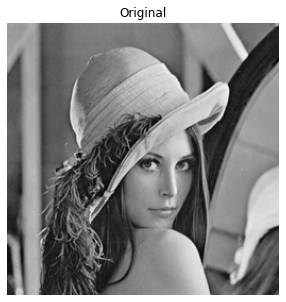

In [ ]:
fig = plt.figure(figsize=(5,5))

fig.add_subplot(1,1,1,title='Original')
plt.imshow(hide,cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
sig, N = image_to_sound(hide)
sig_flat = sig.flatten(order='F').astype(np.int32)
print(sig.shape, N)

(512, 256) 512


(512, 256)
<ipython-input-3-e560598186a9>:23: ComplexWarning: Casting complex values to real discards the imaginary part
  Q[k,:] = np.add(Q[k,:], np.multiply(sig[n,:], (np.cos( w(k,N) * n) - (1j)*np.sin( w(k,N) * n) ) ) )


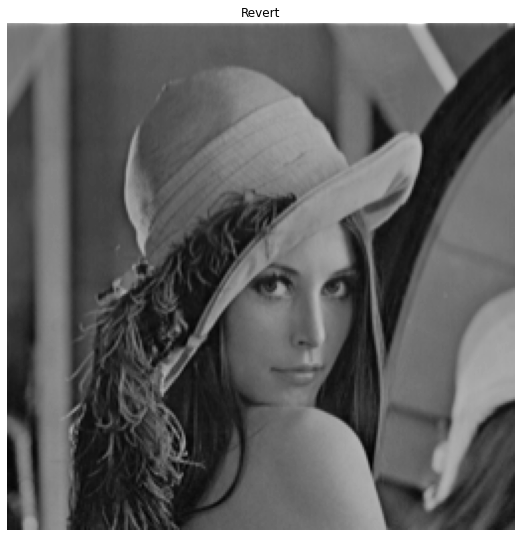

In [ ]:
sig_inv = sound_to_image(sig_flat, N)


fig = plt.figure(figsize=(20,20))

# fig.add_subplot(1,2,1,title='Original')
# plt.imshow(hide,cmap='gray')
# plt.axis('off')

fig.add_subplot(1,2,2,title='Revert')
plt.imshow(cv2.normalize(sig_inv, dst=None, alpha=0,beta=255,norm_type=cv2.NORM_MINMAX,dtype=cv2.CV_8U),cmap='gray')
plt.axis('off')
plt.savefig('Original and Sig inverse')
plt.show()

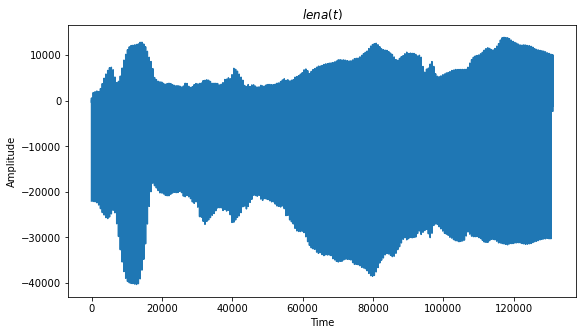

array([-21996, -11428,  -2261, ...,   -211,   6704,  10009], dtype=int32)

<Figure size 432x288 with 0 Axes>

In [ ]:
# if sig_flat.shape[0] % 2 == 0:
#     sig_flat[-1] = N
# else:
#     sig_flat = np.append(sig_flat, [N])
sample_rate = sig_flat.shape[0]

fig = plt.figure(figsize=(20,5))
fig.add_subplot(1,2,1, title=(r'$lena(t)$'))
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.plot(np.arange(sample_rate), sig_flat)
plt.show()
plt.savefig('cameraman')
sig_flat

In [ ]:
write('secret.wav', sample_rate, sig_flat)
sig_flat

array([-21996, -11428,  -2261, ...,   -211,   6704,  10009], dtype=int32)

# Set up Cover Image

In [ ]:
def Haar2D_int2int(S):
    I,J = S.shape
    A = np.zeros(shape=(I//2,J))
    B = np.zeros(shape=(I//2,J))

    cA = np.zeros(shape=(I//2,J//2))
    cH = np.zeros(shape=(I//2,J//2))
    cV = np.zeros(shape=(I//2,J//2))
    cD = np.zeros(shape=(I//2,J//2))

    for j in range(J):
        A[:,j], B[:,j] = Haar_int2int(S[:,j])
    half = floor(I/2)
    for i in range(I):
        if i < half:
            cA[i,:], cH[i,:] = Haar_int2int(A[i,:])  
        else:
            cV[i-half,:], cD[i-half,:] = Haar_int2int(B[i-half,:])  
    return cA.astype(np.int32), cH.astype(np.int32), cV.astype(np.int32), cD.astype(np.int32)

def iHaar2D_int2int(cA, cH, cV, cD):
    I,J = cA.shape
    A = np.zeros(shape=(I,J*2))
    B = np.zeros(shape=(I,J*2))

    S = np.zeros(shape=(I*2,J*2))

    half = floor((I*2)/2)
    for i in range(I*2-1, -1,-1):
        if i < half:
            A[i,:] = iHaar_int2int(cA[i,:], cH[i,:])
        else:
            B[i-half,:] = iHaar_int2int(cV[i-half,:], cD[i-half,:])

    for j in range(J*2-1,-1,-1):
        S[:,j] = iHaar_int2int(A[:,j], B[:,j])
    return S.astype(np.int32)

def Haar_int2int(S):
    E = S[np.ix_(*[range(0,i,2) for i in S.shape])]
    O = S[np.ix_(*[range(1,i,2) for i in S.shape])]
    d = np.subtract(O, E)
    S = np.floor((np.divide(np.add(O, E),2)))
    return S.astype(np.int32), d.astype(np.int32)

def iHaar_int2int(S, d):
    E = np.add(S, np.floor(np.divide(np.add(d,1),2)))
    O = np.subtract(S, np.floor(np.divide(d,2)))
    I = len(E) + len(O)
    S = np.zeros(shape=I)
    S = np.stack((O,E)).ravel(order='F')
    return S.astype(np.int32)

In [ ]:
def plot_hist(data, r, title=None):
    # Helper function for plotting histograms
    color = ['red', 'green', 'blue']
    for d, c in zip(data, color):
        histogram, bin_edges = np.histogram(d.ravel(), bins=256, range=r)
        plt.hist(histogram, bin_edges[0:-1], color=c, alpha=0.2)

    if title:
        plt.title(title)

In [ ]:
cover = cv2.imread('tina.png').astype(np.int32)
# fig = plt.figure(figsize=(15,15))
# fig.add_subplot(1,2,1,title='Original')
# plt.imshow(cover)
# plt.axis('off')
# plt.show()
# fig = plt.figure(figsize=(10,10))
# plot_hist(cover[...,2], (0,255), 'Cover Original Histogram')
print(cover.shape)
cover = exposure.rescale_intensity(cover, in_range=(0,255), out_range=(15,240)).astype(np.int32)

# fig = plt.figure(figsize=(10,10))

# plot_hist(cover[...,2], (15,240), 'Cover Modified Histogram [15-240]')

# fig = plt.figure(figsize=(5,5))

# fig.add_subplot(1,2,2,title='Rescale _Intensity')
# plt.imshow(cover)
# plt.axis('off')
# plt.show()

(1060, 1024, 3)


In [ ]:
# cover_ycrcb = color.convert_colorspace(cover, 'rgb', 'ycbcr')
# dec = np.mod(cover_ycrcb, 1)
# ints = cover_ycrcb.astype(np.int32)
ints = cover

In [ ]:
cover[...,1]

array([[53, 52, 55, ..., 51, 43, 32],
       [52, 53, 55, ..., 51, 42, 37],
       [52, 55, 54, ..., 51, 43, 34],
       ...,
       [47, 47, 45, ..., 88, 84, 83],
       [47, 47, 45, ..., 87, 83, 82],
       [48, 48, 46, ..., 86, 84, 85]], dtype=int32)

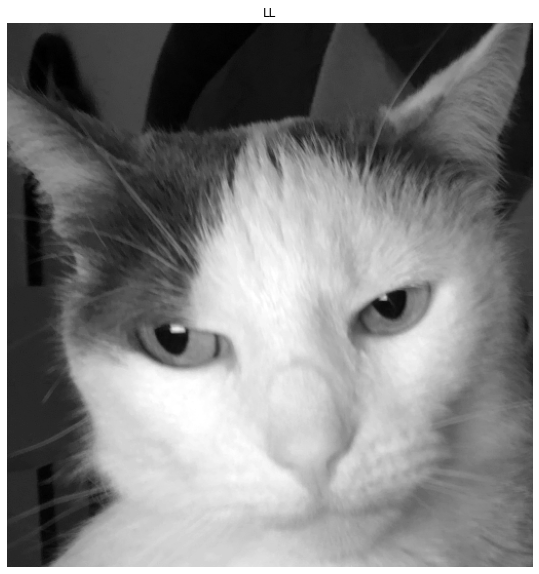

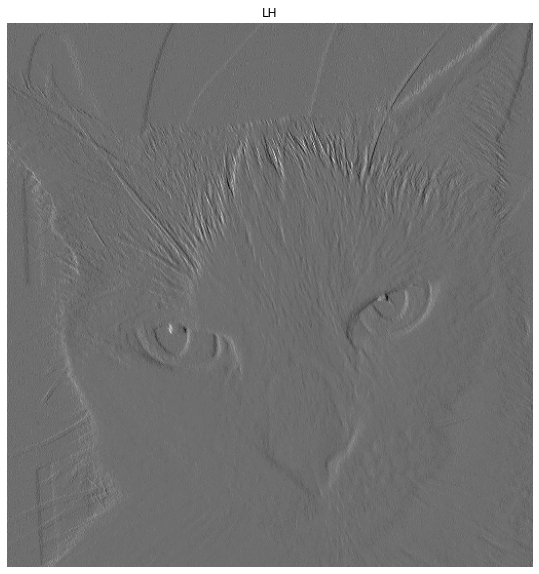

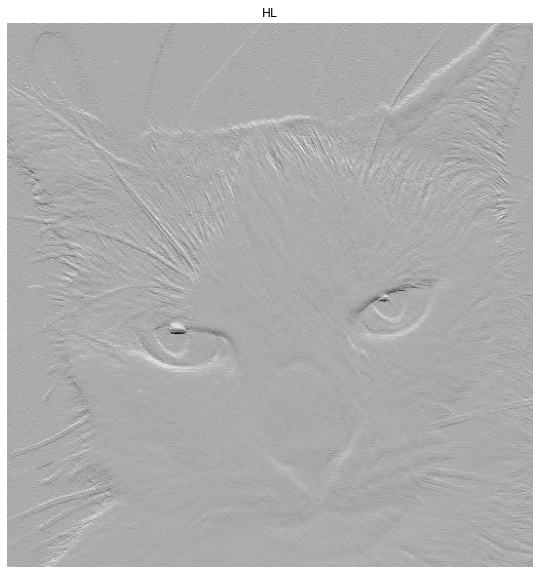

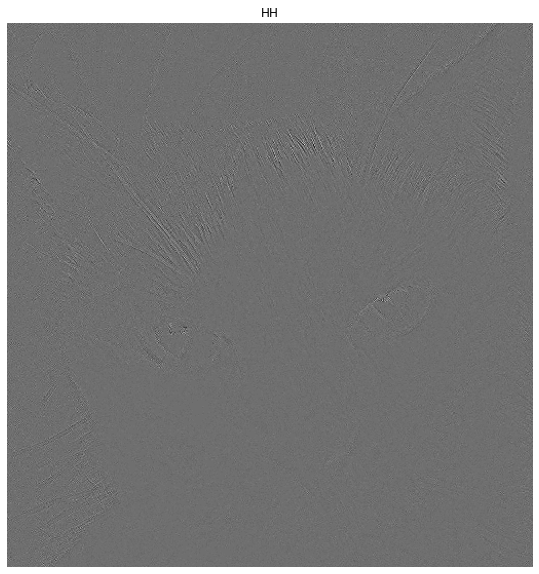

In [ ]:
LL, LH, HL, HH = Haar2D_int2int(ints[:,:,2])

fig = plt.figure(figsize=(10,10))

fig.add_subplot(1,1,1, title='LL')
plt.imshow(LL, cmap='gray')
plt.axis('off')
plt.show()

fig = plt.figure(figsize=(10,10))

fig.add_subplot(1,1,1, title='LH')
plt.imshow(LH,cmap='gray')
plt.axis('off')
plt.show()
fig = plt.figure(figsize=(10,10))

fig.add_subplot(1,1,1, title='HL')
plt.imshow(HL,cmap='gray')
plt.axis('off')
plt.show()
fig = plt.figure(figsize=(10,10))

fig.add_subplot(1,1,1, title='HH')
plt.imshow(HH,cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
cA, cD = Haar_int2int(sig_flat)

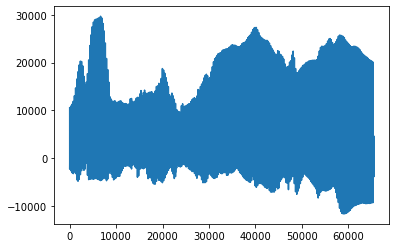

In [ ]:
plt.plot(np.arange(cD.shape[0]),cD)

In [ ]:
cover.shape

(1060, 1024, 3)

In [ ]:
def hide_coe(S, I, n):
    if np.where(I > 0)[0].shape[0] - S.shape[0] > 32:
        m = 0
        shift=0
        done = False
        for i in range(I.shape[0]):
            if done:
                break
            for j in range(I.shape[1]):
                if m == S.shape[0]:
                    done = True
                    break
                if I[i,j] > 0:
                    b = S[m] & 1
                    I[i,j] |= b
                    S[m] >>= 1
                    shift+=1
                if shift % 32 == 0 and shift != 0:
                    shift = 0
                    m+=1
    else:
        print('Choose a different cover image')
    return I

def retrieve_coe(I, n):
    s = (n * (n/2)) / 2
    S = np.zeros(shape=int(s))
    m = 0
    shift = 0
    done = False
    num = []
    for i in range(I.shape[0]):
        if done:
            break
        for j in range(I.shape[1]):
            if m == S.shape[0]:
                done = True
                break
            if I[i,j] > 0:
                b = I[i,j] & 1
                num.insert(0,b)
                shift+=1
            if shift % 32 == 0 and shift != 0:
                shift = 0
                S[m] = int(''.join(map(str,num)), 2)
                num = []
                m+=1
    return S

In [ ]:
HH = hide_coe(cA, HH, N)
HL = hide_coe(cD, HL, N)

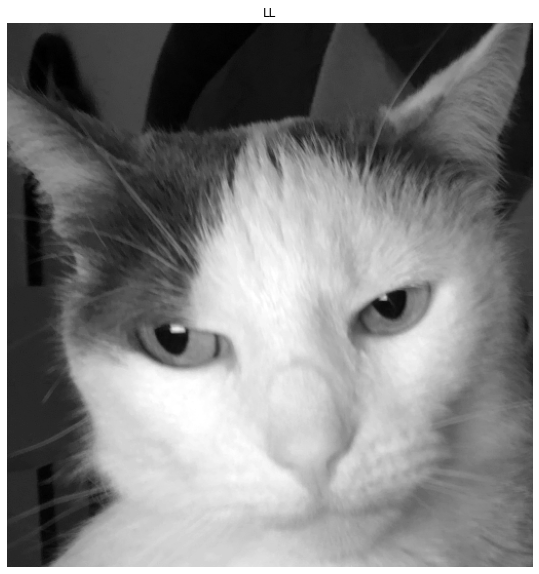

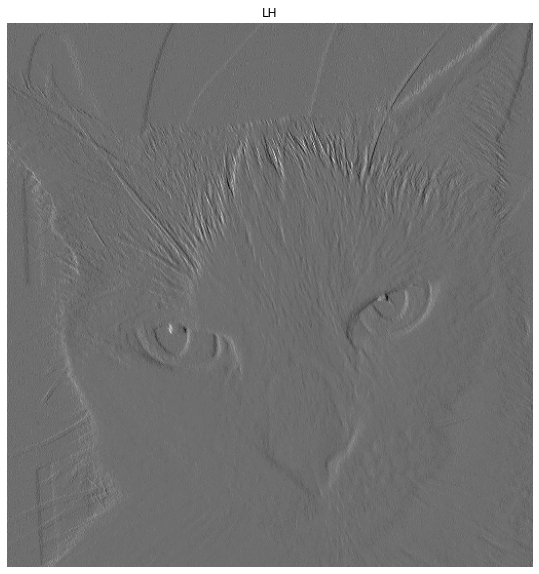

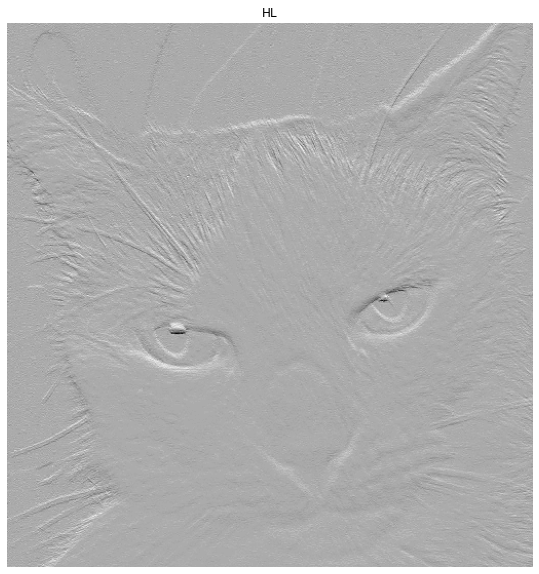

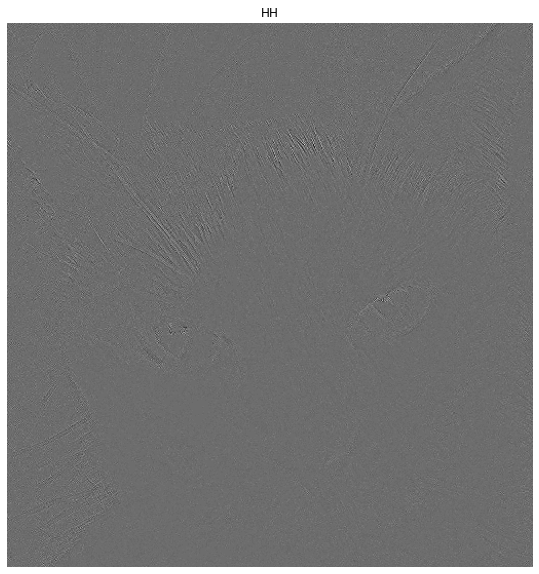

In [ ]:
fig = plt.figure(figsize=(10,10))

fig.add_subplot(1,1,1, title='LL')
plt.imshow(LL, cmap='gray')
plt.axis('off')
plt.show()

fig = plt.figure(figsize=(10,10))

fig.add_subplot(1,1,1, title='LH')
plt.imshow(LH,cmap='gray')
plt.axis('off')
plt.show()
fig = plt.figure(figsize=(10,10))

fig.add_subplot(1,1,1, title='HL')
plt.imshow(HL,cmap='gray')
plt.axis('off')
plt.show()
fig = plt.figure(figsize=(10,10))

fig.add_subplot(1,1,1, title='HH')
plt.imshow(HH,cmap='gray')
plt.axis('off')
plt.show()

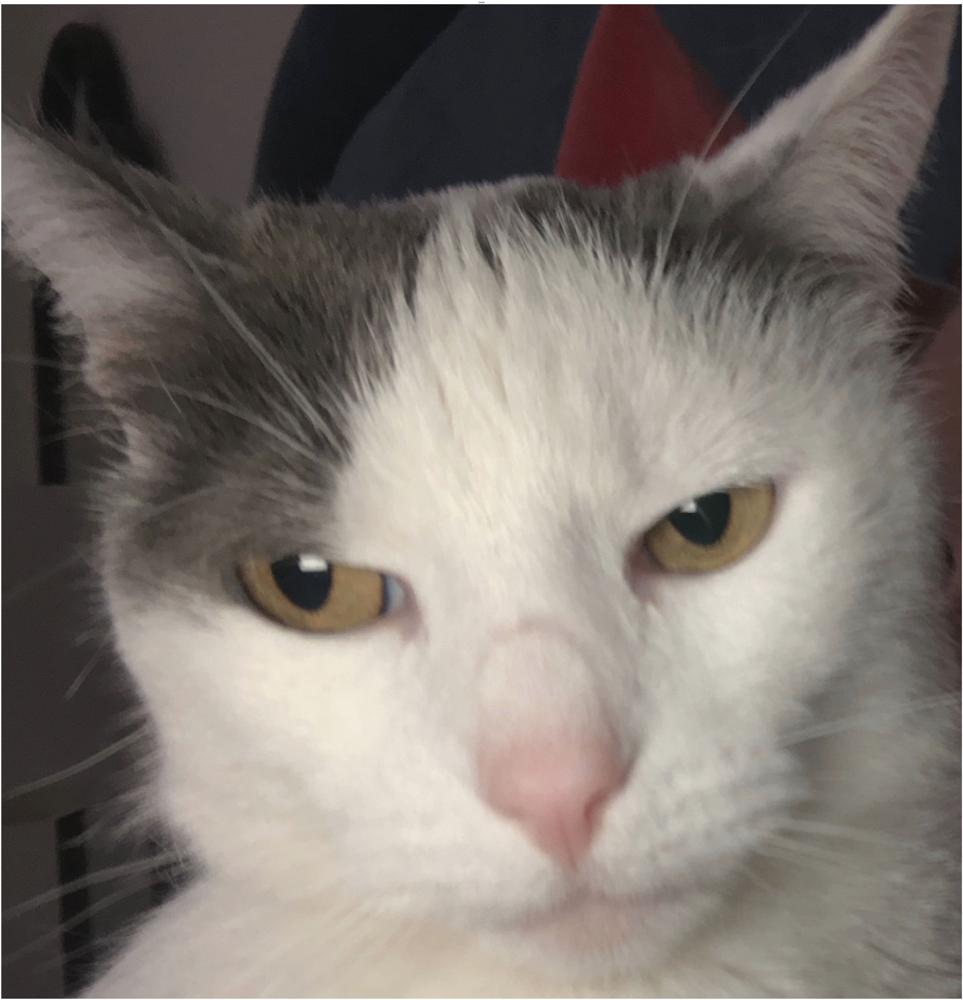

In [ ]:
ints[:,:,2] = iHaar2D_int2int(LL, LH, HL, HH)
# stego = cv2.cvtColor(ints.astype(np.uint8), cv2.COLOR_YCR_CB2BGR)
# stego = color.convert_colorspace(ints, 'YCbCr', 'RGB')
# stego = exposure.rescale_intensity(stego, out_range=(15,240)).astype(np.uint8)
stego = ints.astype(np.uint8)

fig = plt.figure(figsize=(100,100))
fig.add_subplot(1,1,1,title='Cover')
plt.imshow(stego[...,::-1])
plt.axis('off')
plt.savefig("stego")
plt.show()

In [ ]:
io.imsave('stego.png', stego)

In [ ]:
# stego_ycbcr = cv2.cvtColor(stego, cv2.COLOR_RGB2YCR_CB)
# ints = stego_ycbcr.astype(np.int32)
stego = stego.astype(np.int32)

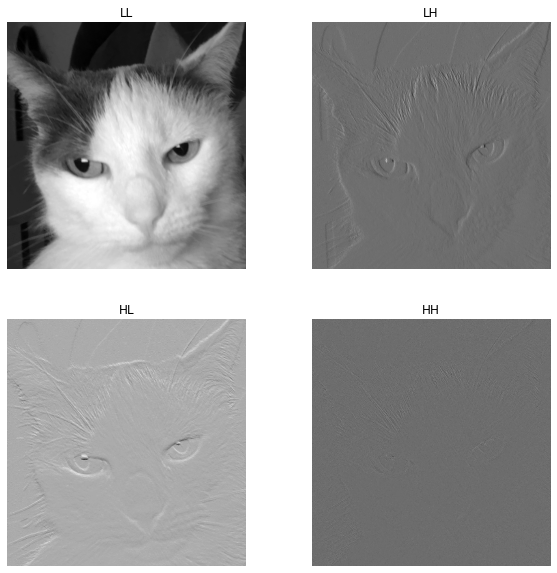

In [ ]:
LL, LH, HL, HH = Haar2D_int2int(ints[:,:,2])

fig = plt.figure(figsize=(10,10))

fig.add_subplot(2,2,1, title='LL')
plt.imshow(LL, cmap='gray')
plt.axis('off')

fig.add_subplot(2,2,2, title='LH')
plt.imshow(LH,cmap='gray')
plt.axis('off')

fig.add_subplot(2,2,3, title='HL')
plt.imshow(HL,cmap='gray')
plt.axis('off')

fig.add_subplot(2,2,4, title='HH')
plt.imshow(HH,cmap='gray')
plt.axis('off')

plt.show()

In [ ]:
def retrieve_coe(I, n):
    s = (n * (n/2)) / 2
    S = np.zeros(shape=int(s))
    m = 0
    shift = 0
    done = False
    num = []
    for i in range(I.shape[0]):
        if done:
            break
        for j in range(I.shape[1]):
            if shift % 16 == 0 and shift != 0:
                shift = 0
                S[m] = int(''.join(map(str,num)), 2)
                num = []
                m+=1
            if m == S.shape[0]:
                done = True
                break
            if I[i,j] > 0:
                b = I[i,j] & 1
                num.insert(0,b)
                shift+=1
    return S

In [ ]:
ret_cA = retrieve_coe(HH, N)
ret_cD = retrieve_coe(HL, N)

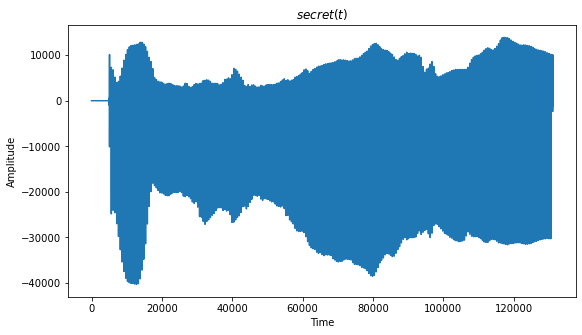

In [ ]:
signal = iHaar_int2int(cA, cD)
sample_rate = signal.shape[0]

fig = plt.figure(figsize=(20,5))
fig.add_subplot(1,2,1)
plt.title(r'$secret(t)$')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.plot(np.arange(sample_rate), signal)
plt.show()

(512, 256)
<ipython-input-3-e560598186a9>:23: ComplexWarning: Casting complex values to real discards the imaginary part
  Q[k,:] = np.add(Q[k,:], np.multiply(sig[n,:], (np.cos( w(k,N) * n) - (1j)*np.sin( w(k,N) * n) ) ) )


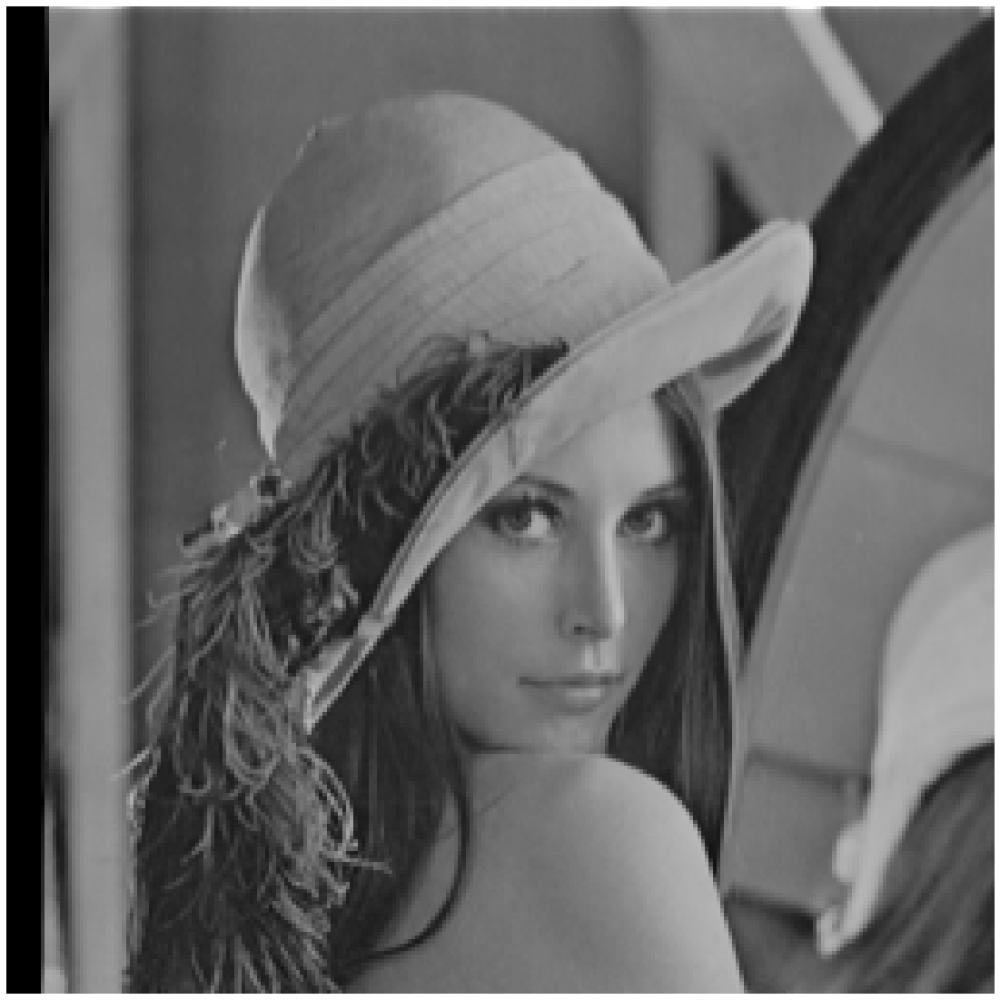

In [ ]:
sig_inv = sound_to_image(signal, N)

fig = plt.figure(figsize=(20,20))
plt.imshow(cv2.normalize(sig_inv, dst=None, alpha=0,beta=255,norm_type=cv2.NORM_MINMAX,dtype=cv2.CV_8U),cmap='gray')
plt.axis('off')

plt.show()

In [ ]:
cv2.imwrite('sig.png',sig_inv)

True